In [ ]:
import torch
from torch import nn
from torchvision import transforms
from torchvision.datasets  import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

In [ ]:
def show_tensor_images(image_tensor,num_image = 25,size = (1,28,28)):
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_image],nrow = 5)
    plt.imshow(image_grid.permute(1,2,0).squeeze())
    plt.show()

In [ ]:
def generator_block(input_dim,output_dim):
    return nn.Sequential(
        nn.Linear(input_dim,output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace = True)
        
        )

In [ ]:
#create generator class
class generator(nn.Module):
    def __init__(self,z_dim = 10,im_dim = 784,hidden_dim = 128):
        super(generator,self).__init__()
        self.gen = nn.Sequential(
                generator_block(z_dim,hidden_dim),
                generator_block(hidden_dim,hidden_dim*2),
                generator_block(hidden_dim*2,hidden_dim*4),
                generator_block(hidden_dim*4,hidden_dim*8),
                nn.Linear(hidden_dim*8,im_dim),
                nn.Sigmoid()
                )
    def forward(self,noise):
        return self.gen(noise)


        
        

In [ ]:
def get_noise(n_sampels,z_dim,device = 'cpu'):
    return torch.randn(n_sampels,z_dim,device = device)
    

In [ ]:
def discriminator_block(input_dim,output_dim):
    return nn.Sequential(
            nn.Linear(input_dim,output_dim),
            nn.LeakyReLU()
            )

In [ ]:
class discriminator(nn.Module):
    def __init__(self,im_dim = 784,hidden_dim = 128):
        super(discriminator,self).__init__()
        
        self.disc = nn.Sequential(
                    discriminator_block(im_dim,hidden_dim*4),
                    discriminator_block(hidden_dim*4,hidden_dim*2),
                    discriminator_block(hidden_dim*2,hidden_dim),
                    nn.Linear(hidden_dim,1)
                        )
    def forward(self,image):
        return self.disc(image)

In [ ]:
#training
#set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

dataloader = DataLoader(
                MNIST('.',download = True,transform = transforms.ToTensor()),
                batch_size = batch_size,
                shuffle = True)

device = 'cpu'

In [ ]:
gen = generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(),lr = lr)
disc = discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(),lr = lr)

In [ ]:
def get_disc_loss(gen,disc,criterion,real,num_images,z_dim,device):
    fake_noise = get_noise(num_images, z_dim, device = device)
    fake = gen(fake_noise)
    disc_fake_predict = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_predict, torch.zeros_like(disc_fake_predict))
    disc_real_predict = disc(real)
    disc_real_loss = criterion(disc_real_predict,torch.ones_like(disc_real_predict))
    
    disc_loss = (disc_fake_loss + disc_real_loss)/2
    
    return disc_loss
    

In [ ]:
def get_gen_loss(gen, disc,criterion,num_images,z_dim,device):
    fake_noise = get_noise(num_images,z_dim,device = device)
    fake_img_pred = gen(fake_noise)
    disc_fake_pred = disc(fake_img_pred)
    gen_loss = criterion(disc_fake_pred,torch.ones_like(disc_fake_pred))
    return gen_loss
    

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

step : 500, epoch : 1 , mean_discriminator_loss : 0.03250208246335389, mean_generator_loss : 4.732419680595399


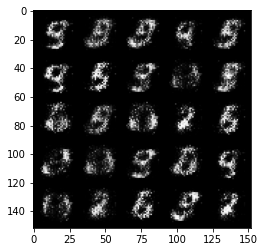

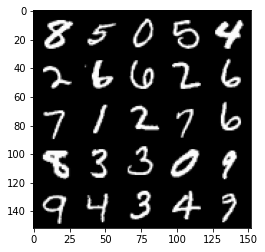

  0%|          | 0/469 [00:00<?, ?it/s]

step : 1000, epoch : 2 , mean_discriminator_loss : 0.03011529502831398, mean_generator_loss : 4.885595168113708


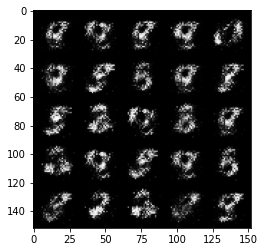

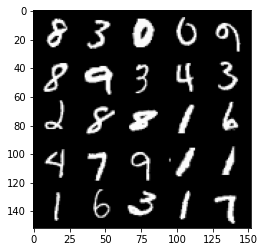

  0%|          | 0/469 [00:00<?, ?it/s]

step : 1500, epoch : 3 , mean_discriminator_loss : 0.025772080641239925, mean_generator_loss : 5.180131228446959


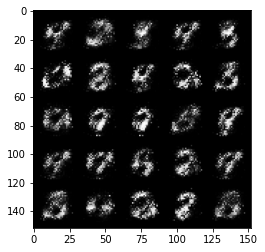

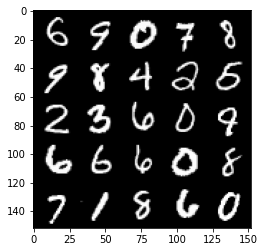

  0%|          | 0/469 [00:00<?, ?it/s]

step : 2000, epoch : 4 , mean_discriminator_loss : 0.03603374881483618, mean_generator_loss : 4.844751962661741


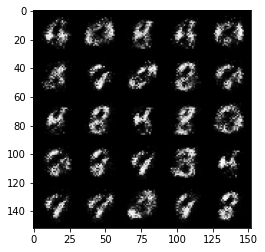

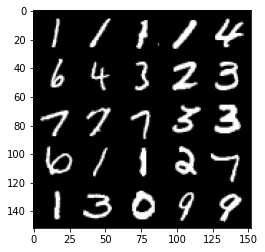

  0%|          | 0/469 [00:00<?, ?it/s]

step : 2500, epoch : 5 , mean_discriminator_loss : 0.035214322429150346, mean_generator_loss : 4.882576097488401


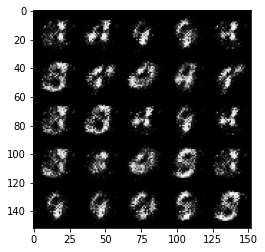

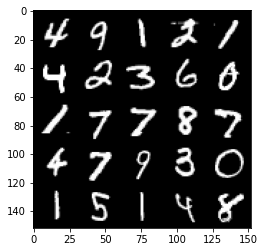

  0%|          | 0/469 [00:00<?, ?it/s]

step : 3000, epoch : 6 , mean_discriminator_loss : 0.030427928308025005, mean_generator_loss : 5.100543356895449


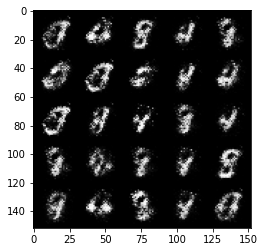

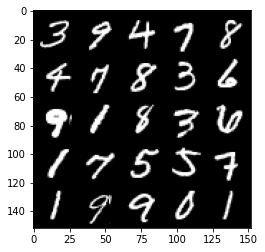

  0%|          | 0/469 [00:00<?, ?it/s]

step : 3500, epoch : 7 , mean_discriminator_loss : 0.026917635846883076, mean_generator_loss : 5.331617417335508


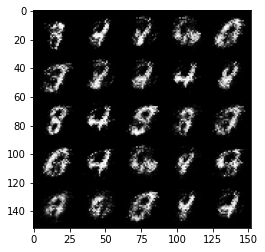

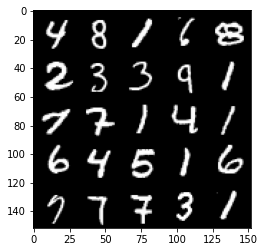

  0%|          | 0/469 [00:00<?, ?it/s]

step : 4000, epoch : 8 , mean_discriminator_loss : 0.028754485450685027, mean_generator_loss : 5.338067117691043


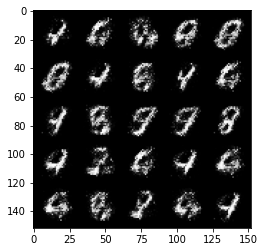

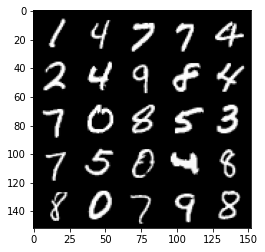

  0%|          | 0/469 [00:00<?, ?it/s]

step : 4500, epoch : 9 , mean_discriminator_loss : 0.026918090062215943, mean_generator_loss : 5.264208926200869


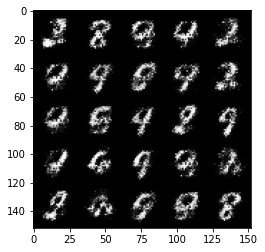

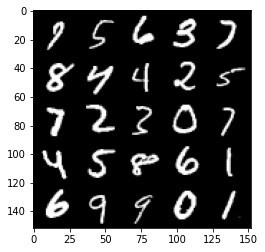

  0%|          | 0/469 [00:00<?, ?it/s]

step : 5000, epoch : 10 , mean_discriminator_loss : 0.03019960622861981, mean_generator_loss : 5.216736314773562


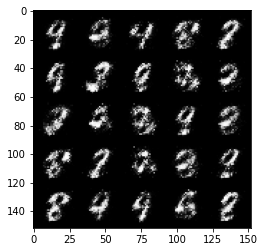

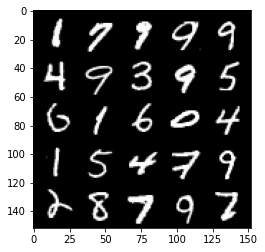

  0%|          | 0/469 [00:00<?, ?it/s]

step : 5500, epoch : 11 , mean_discriminator_loss : 0.03836732407100502, mean_generator_loss : 4.9964366569519045


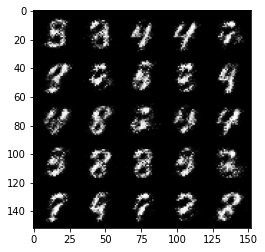

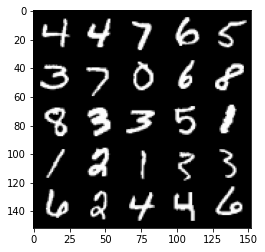

  0%|          | 0/469 [00:00<?, ?it/s]

step : 6000, epoch : 12 , mean_discriminator_loss : 0.04031364875286814, mean_generator_loss : 5.001699608325958


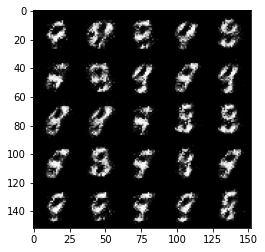

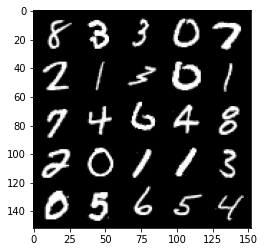

  0%|          | 0/469 [00:00<?, ?it/s]

step : 6500, epoch : 13 , mean_discriminator_loss : 0.044586475955322426, mean_generator_loss : 5.010693906307217


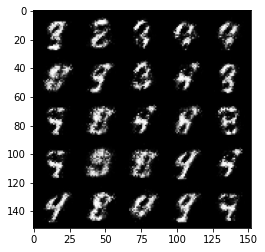

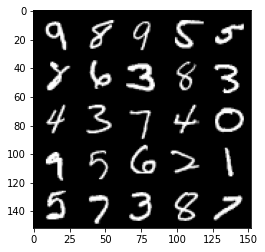

  0%|          | 0/469 [00:00<?, ?it/s]

step : 7000, epoch : 14 , mean_discriminator_loss : 0.04340378543362023, mean_generator_loss : 4.829074921607974


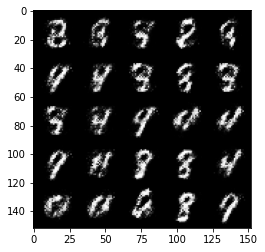

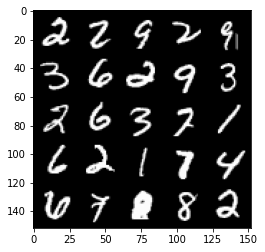

  0%|          | 0/469 [00:00<?, ?it/s]

step : 7500, epoch : 15 , mean_discriminator_loss : 0.045953969918191444, mean_generator_loss : 4.673959823608399


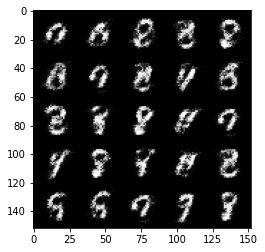

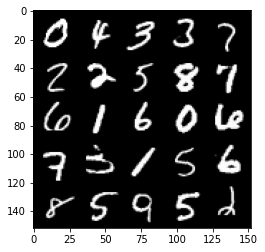

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

step : 8000, epoch : 17 , mean_discriminator_loss : 0.04967092463746666, mean_generator_loss : 4.541277239799501


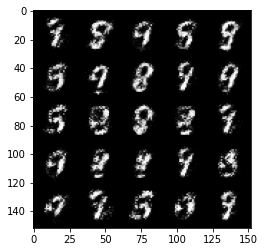

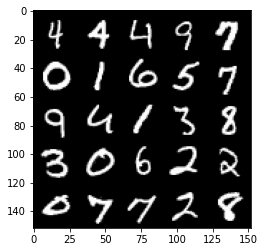

  0%|          | 0/469 [00:00<?, ?it/s]

step : 8500, epoch : 18 , mean_discriminator_loss : 0.05341412797570229, mean_generator_loss : 4.43487585735321


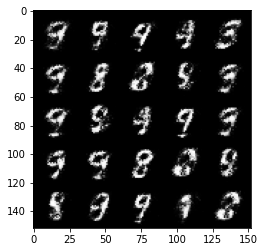

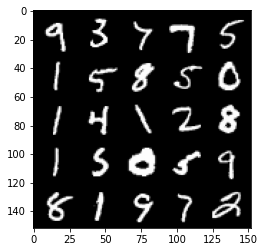

  0%|          | 0/469 [00:00<?, ?it/s]

step : 9000, epoch : 19 , mean_discriminator_loss : 0.06466164122894405, mean_generator_loss : 4.29410915851593


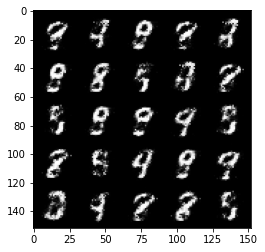

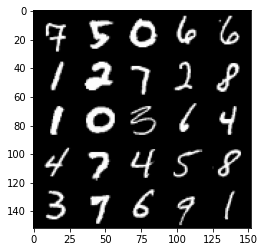

  0%|          | 0/469 [00:00<?, ?it/s]

step : 9500, epoch : 20 , mean_discriminator_loss : 0.060015759993344554, mean_generator_loss : 4.451244148731237


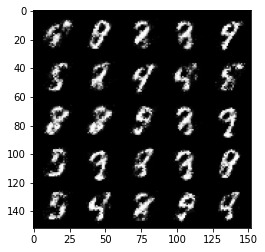

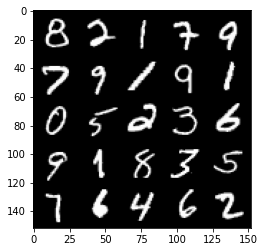

  0%|          | 0/469 [00:00<?, ?it/s]

step : 10000, epoch : 21 , mean_discriminator_loss : 0.06858922051265838, mean_generator_loss : 4.2485344748497065


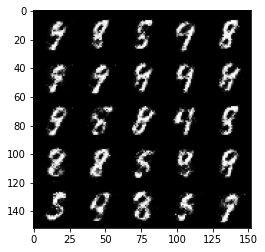

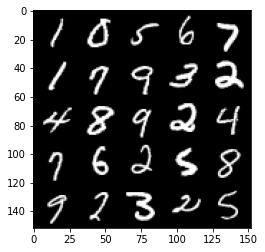

  0%|          | 0/469 [00:00<?, ?it/s]

step : 10500, epoch : 22 , mean_discriminator_loss : 0.07095422286167745, mean_generator_loss : 4.18571457576752


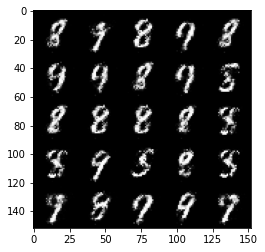

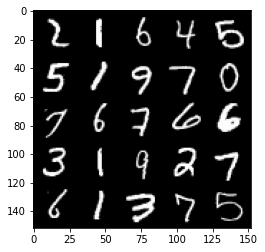

  0%|          | 0/469 [00:00<?, ?it/s]

step : 11000, epoch : 23 , mean_discriminator_loss : 0.07505553425848491, mean_generator_loss : 4.081277760982517


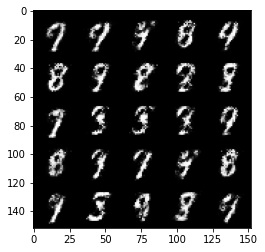

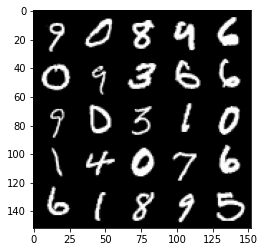

  0%|          | 0/469 [00:00<?, ?it/s]

step : 11500, epoch : 24 , mean_discriminator_loss : 0.08392506102845072, mean_generator_loss : 4.373344359874728


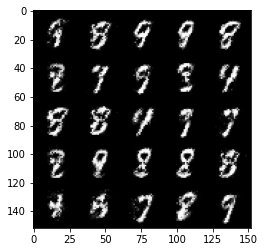

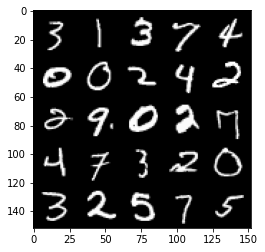

  0%|          | 0/469 [00:00<?, ?it/s]

step : 12000, epoch : 25 , mean_discriminator_loss : 0.08295443902909751, mean_generator_loss : 4.227657215118412


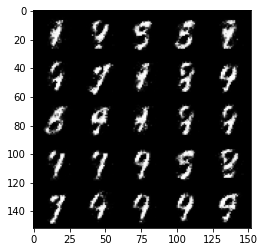

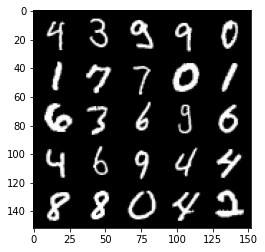

  0%|          | 0/469 [00:00<?, ?it/s]

step : 12500, epoch : 26 , mean_discriminator_loss : 0.09482383520156146, mean_generator_loss : 3.931693691253662


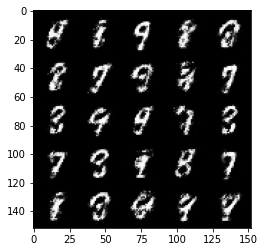

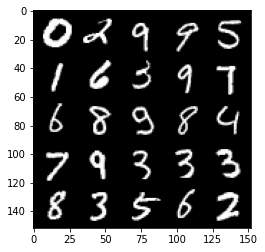

  0%|          | 0/469 [00:00<?, ?it/s]

step : 13000, epoch : 27 , mean_discriminator_loss : 0.09266880768165003, mean_generator_loss : 4.069795732975006


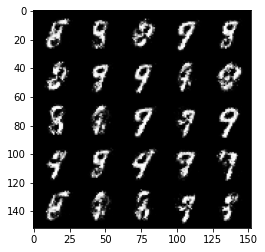

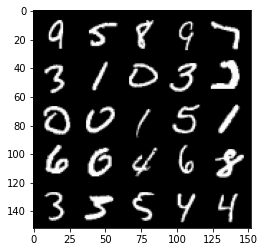

  0%|          | 0/469 [00:00<?, ?it/s]

step : 13500, epoch : 28 , mean_discriminator_loss : 0.09956919731199744, mean_generator_loss : 3.8980046916007924


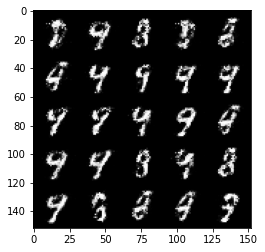

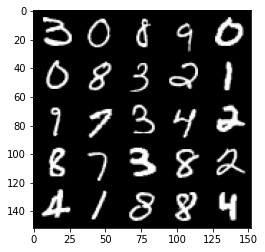

  0%|          | 0/469 [00:00<?, ?it/s]

step : 14000, epoch : 29 , mean_discriminator_loss : 0.11076597653329374, mean_generator_loss : 4.016061944961546


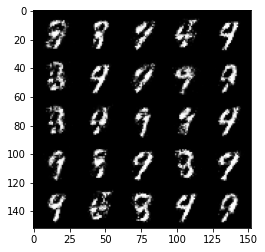

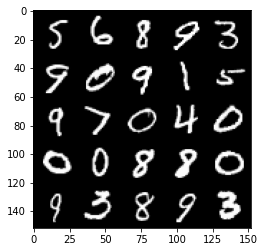

  0%|          | 0/469 [00:00<?, ?it/s]

step : 14500, epoch : 30 , mean_discriminator_loss : 0.10168842167407287, mean_generator_loss : 4.014578166007994


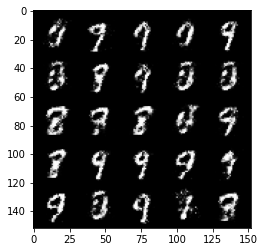

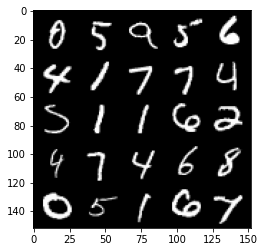

  0%|          | 0/469 [00:00<?, ?it/s]

step : 15000, epoch : 31 , mean_discriminator_loss : 0.11342311903089282, mean_generator_loss : 3.7825784969329868


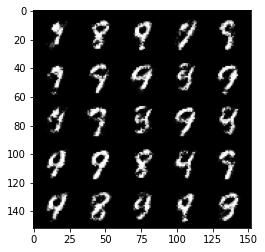

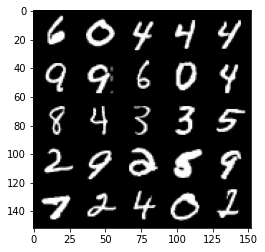

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

step : 15500, epoch : 33 , mean_discriminator_loss : 0.12025478745996952, mean_generator_loss : 3.6782137804031407


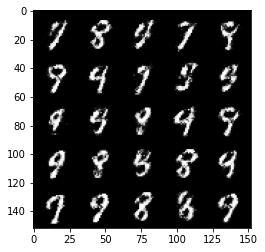

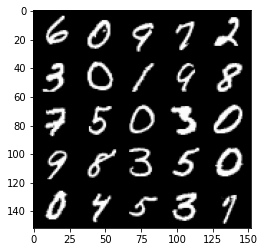

  0%|          | 0/469 [00:00<?, ?it/s]

step : 16000, epoch : 34 , mean_discriminator_loss : 0.12746979708969597, mean_generator_loss : 3.723070490360264


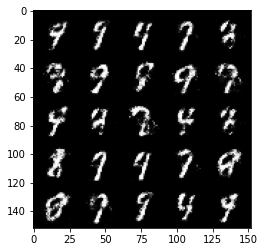

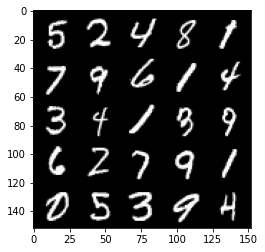

  0%|          | 0/469 [00:00<?, ?it/s]

step : 16500, epoch : 35 , mean_discriminator_loss : 0.13978492717444901, mean_generator_loss : 3.779706087112425


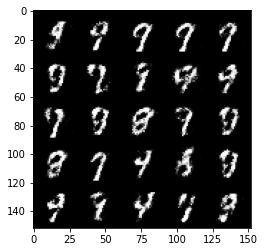

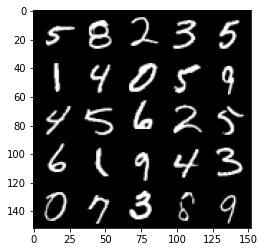

  0%|          | 0/469 [00:00<?, ?it/s]

step : 17000, epoch : 36 , mean_discriminator_loss : 0.14409003912657514, mean_generator_loss : 3.589697137832638


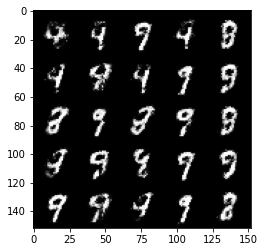

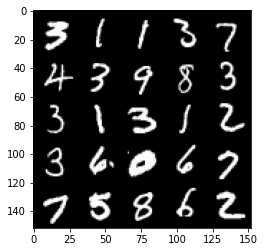

  0%|          | 0/469 [00:00<?, ?it/s]

step : 17500, epoch : 37 , mean_discriminator_loss : 0.15221721079945555, mean_generator_loss : 3.51737871789932


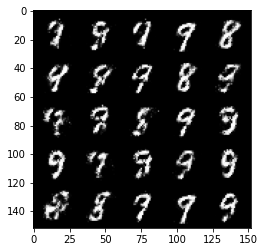

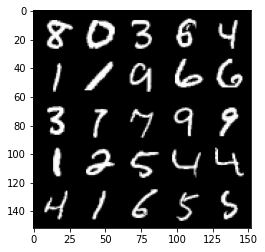

  0%|          | 0/469 [00:00<?, ?it/s]

step : 18000, epoch : 38 , mean_discriminator_loss : 0.1421027015224099, mean_generator_loss : 3.527260167598726


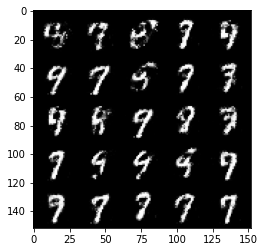

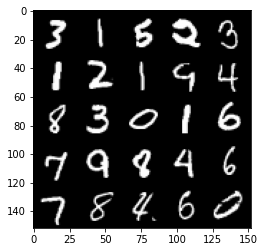

  0%|          | 0/469 [00:00<?, ?it/s]

step : 18500, epoch : 39 , mean_discriminator_loss : 0.158181659668684, mean_generator_loss : 3.427012123107912


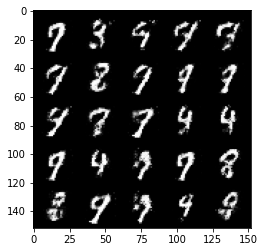

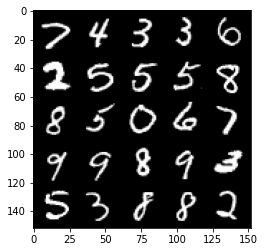

  0%|          | 0/469 [00:00<?, ?it/s]

step : 19000, epoch : 40 , mean_discriminator_loss : 0.14900159628689294, mean_generator_loss : 3.4079268984794613


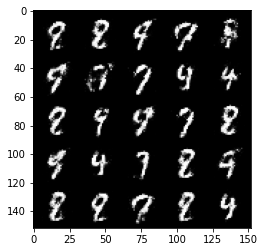

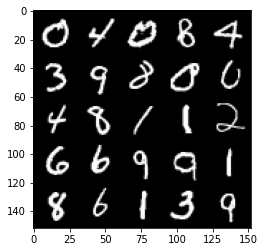

  0%|          | 0/469 [00:00<?, ?it/s]

step : 19500, epoch : 41 , mean_discriminator_loss : 0.14660363796353343, mean_generator_loss : 3.416823932170867


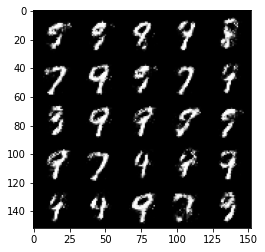

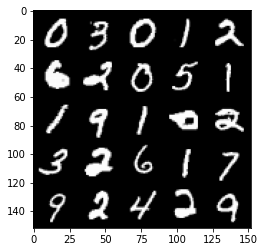

  0%|          | 0/469 [00:00<?, ?it/s]

step : 20000, epoch : 42 , mean_discriminator_loss : 0.18863049024343484, mean_generator_loss : 3.1251738924980135


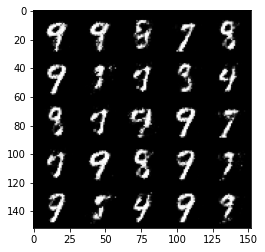

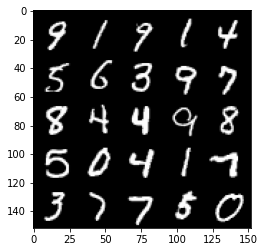

  0%|          | 0/469 [00:00<?, ?it/s]

step : 20500, epoch : 43 , mean_discriminator_loss : 0.1676262001097202, mean_generator_loss : 3.2359975161552414


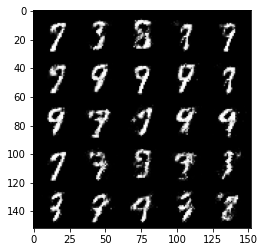

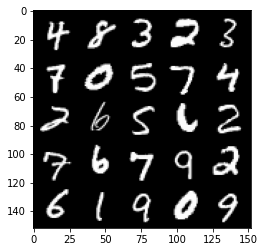

  0%|          | 0/469 [00:00<?, ?it/s]

step : 21000, epoch : 44 , mean_discriminator_loss : 0.16435945814847946, mean_generator_loss : 3.315078329086304


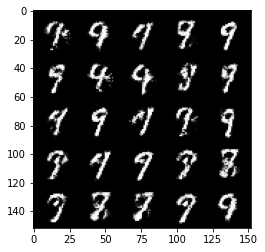

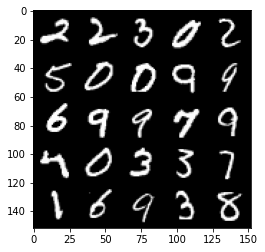

  0%|          | 0/469 [00:00<?, ?it/s]

step : 21500, epoch : 45 , mean_discriminator_loss : 0.1603373745232824, mean_generator_loss : 3.334811464309691


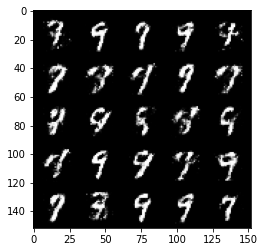

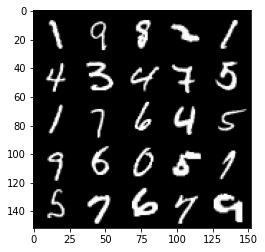

  0%|          | 0/469 [00:00<?, ?it/s]

step : 22000, epoch : 46 , mean_discriminator_loss : 0.17660647866129883, mean_generator_loss : 3.1852814111709575


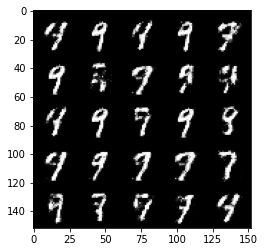

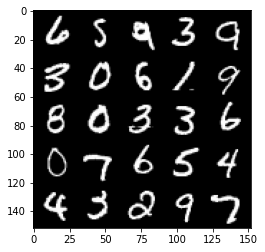

  0%|          | 0/469 [00:00<?, ?it/s]

step : 22500, epoch : 47 , mean_discriminator_loss : 0.1610302500128746, mean_generator_loss : 3.2684281792640677


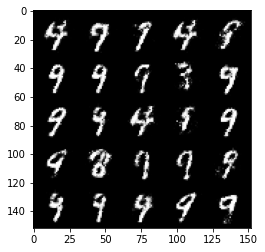

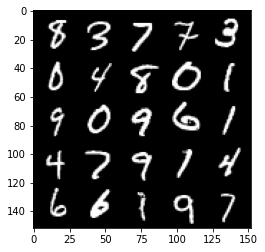

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

step : 23000, epoch : 49 , mean_discriminator_loss : 0.1854448841512202, mean_generator_loss : 3.1522115983963026


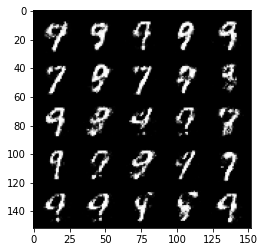

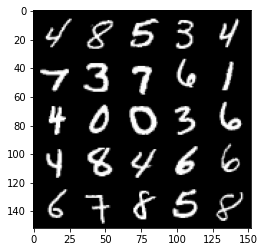

  0%|          | 0/469 [00:00<?, ?it/s]

step : 23500, epoch : 50 , mean_discriminator_loss : 0.17988800135254854, mean_generator_loss : 3.041940958023073


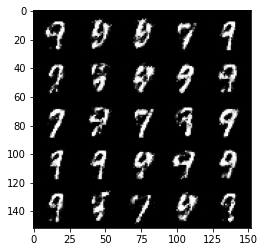

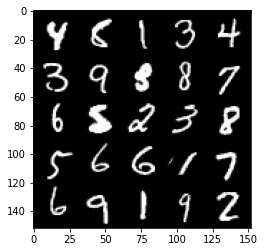

  0%|          | 0/469 [00:00<?, ?it/s]

step : 24000, epoch : 51 , mean_discriminator_loss : 0.16064637972414503, mean_generator_loss : 3.1491387343406623


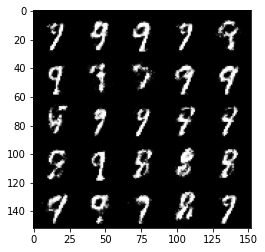

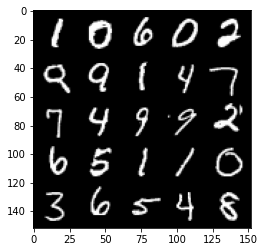

  0%|          | 0/469 [00:00<?, ?it/s]

step : 24500, epoch : 52 , mean_discriminator_loss : 0.20190605835616604, mean_generator_loss : 3.0266023521423353


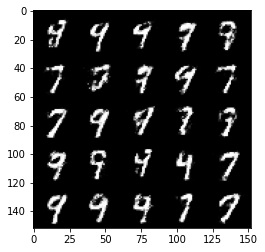

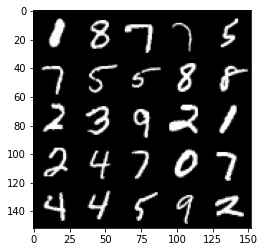

  0%|          | 0/469 [00:00<?, ?it/s]

step : 25000, epoch : 53 , mean_discriminator_loss : 0.1788636887669565, mean_generator_loss : 3.066081476211547


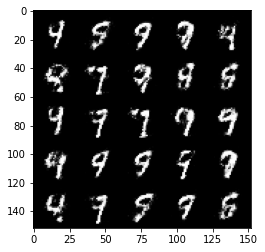

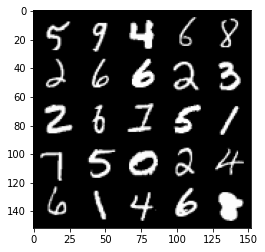

  0%|          | 0/469 [00:00<?, ?it/s]

step : 25500, epoch : 54 , mean_discriminator_loss : 0.18769300074875356, mean_generator_loss : 2.978767104625702


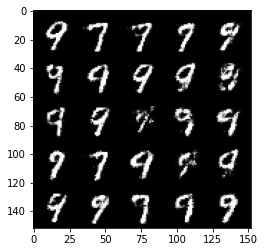

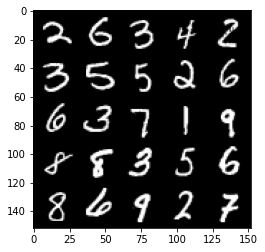

  0%|          | 0/469 [00:00<?, ?it/s]

step : 26000, epoch : 55 , mean_discriminator_loss : 0.19164335736632335, mean_generator_loss : 2.885051080703738


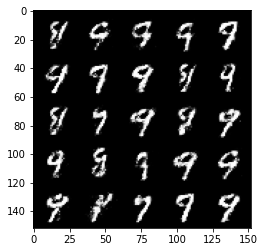

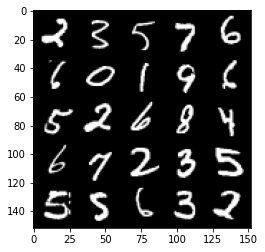

  0%|          | 0/469 [00:00<?, ?it/s]

step : 26500, epoch : 56 , mean_discriminator_loss : 0.2131283358931539, mean_generator_loss : 2.924970092773435


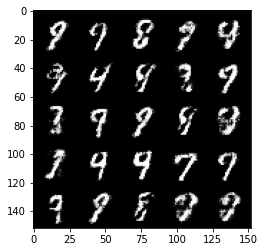

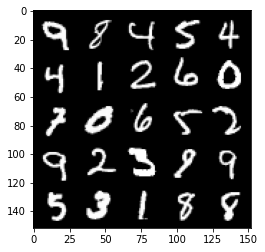

  0%|          | 0/469 [00:00<?, ?it/s]

step : 27000, epoch : 57 , mean_discriminator_loss : 0.1881698912084102, mean_generator_loss : 2.9547907204628


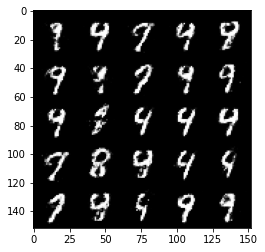

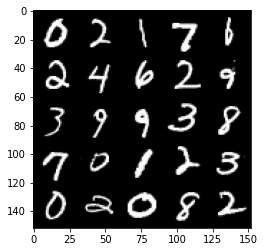

  0%|          | 0/469 [00:00<?, ?it/s]

step : 27500, epoch : 58 , mean_discriminator_loss : 0.20807978412508962, mean_generator_loss : 3.050744142532349


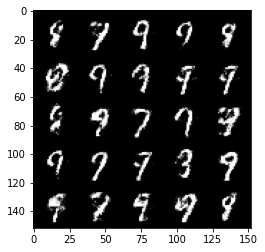

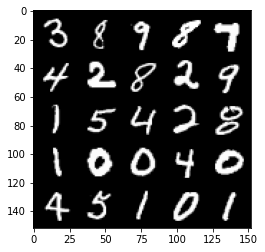

  0%|          | 0/469 [00:00<?, ?it/s]

step : 28000, epoch : 59 , mean_discriminator_loss : 0.1989746886938809, mean_generator_loss : 2.991489870071411


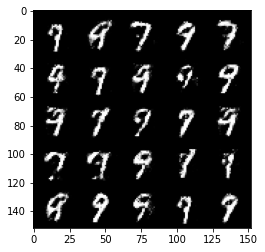

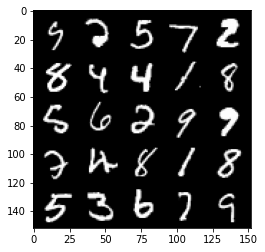

  0%|          | 0/469 [00:00<?, ?it/s]

step : 28500, epoch : 60 , mean_discriminator_loss : 0.2067540161460639, mean_generator_loss : 2.937769976139068


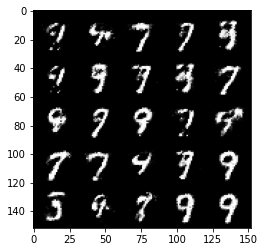

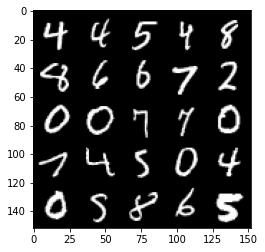

  0%|          | 0/469 [00:00<?, ?it/s]

step : 29000, epoch : 61 , mean_discriminator_loss : 0.1980177222788335, mean_generator_loss : 2.8741699609756473


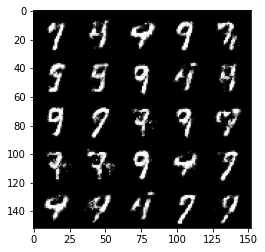

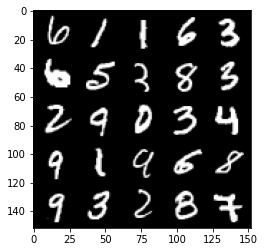

  0%|          | 0/469 [00:00<?, ?it/s]

step : 29500, epoch : 62 , mean_discriminator_loss : 0.19758139243721956, mean_generator_loss : 2.8932239813804603


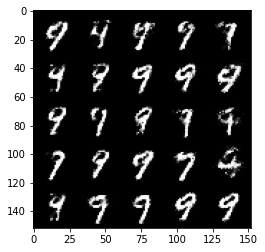

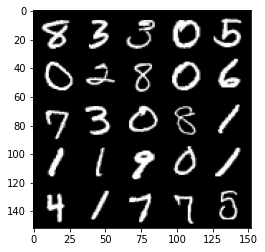

  0%|          | 0/469 [00:00<?, ?it/s]

step : 30000, epoch : 63 , mean_discriminator_loss : 0.20205154004693018, mean_generator_loss : 2.960268553256987


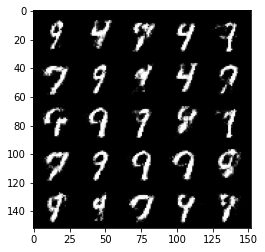

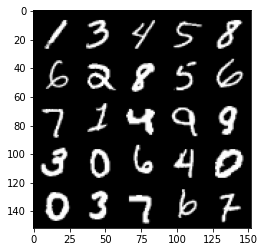

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

step : 30500, epoch : 65 , mean_discriminator_loss : 0.2219272462427616, mean_generator_loss : 2.824117165088653


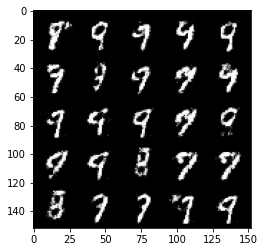

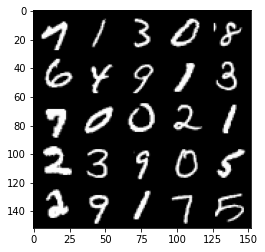

  0%|          | 0/469 [00:00<?, ?it/s]

step : 31000, epoch : 66 , mean_discriminator_loss : 0.20694060070812725, mean_generator_loss : 2.792323842287063


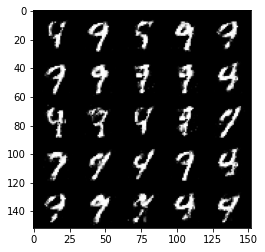

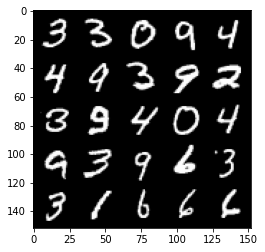

  0%|          | 0/469 [00:00<?, ?it/s]

step : 31500, epoch : 67 , mean_discriminator_loss : 0.2151389579176903, mean_generator_loss : 2.8568720417022666


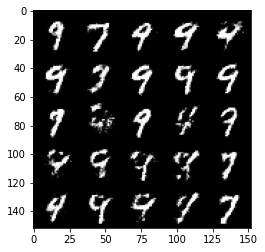

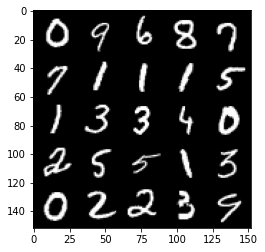

  0%|          | 0/469 [00:00<?, ?it/s]

step : 32000, epoch : 68 , mean_discriminator_loss : 0.20414336381852644, mean_generator_loss : 2.8649165072441076


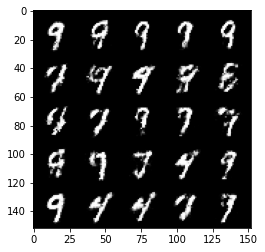

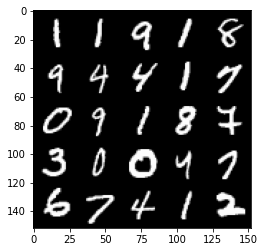

  0%|          | 0/469 [00:00<?, ?it/s]

step : 32500, epoch : 69 , mean_discriminator_loss : 0.2049652182310819, mean_generator_loss : 2.9029463791847254


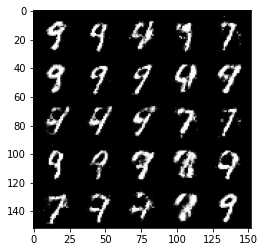

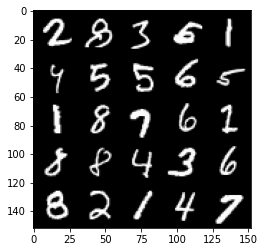

  0%|          | 0/469 [00:00<?, ?it/s]

step : 33000, epoch : 70 , mean_discriminator_loss : 0.21589443242549888, mean_generator_loss : 2.853269039154057


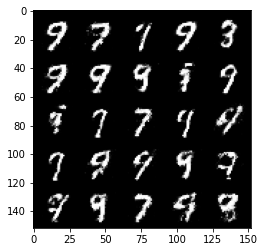

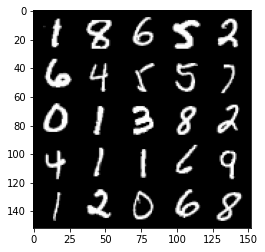

  0%|          | 0/469 [00:00<?, ?it/s]

step : 33500, epoch : 71 , mean_discriminator_loss : 0.21357337459921844, mean_generator_loss : 2.803519265651703


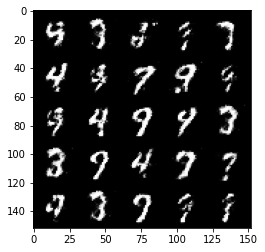

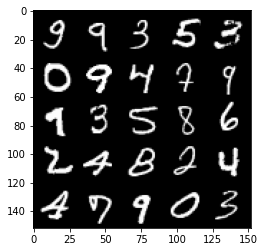

  0%|          | 0/469 [00:00<?, ?it/s]

step : 34000, epoch : 72 , mean_discriminator_loss : 0.2257112547159195, mean_generator_loss : 2.617701583862305


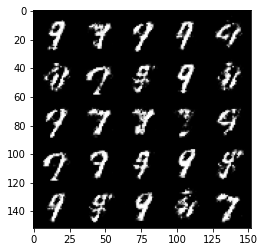

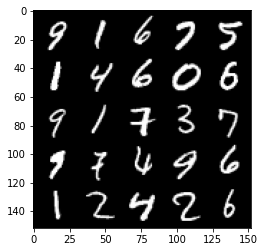

  0%|          | 0/469 [00:00<?, ?it/s]

step : 34500, epoch : 73 , mean_discriminator_loss : 0.2047987092733382, mean_generator_loss : 2.7694849643707267


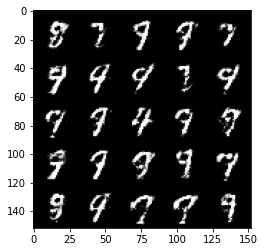

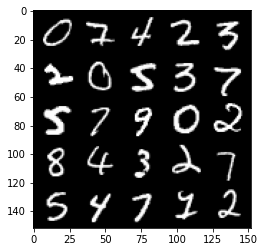

  0%|          | 0/469 [00:00<?, ?it/s]

step : 35000, epoch : 74 , mean_discriminator_loss : 0.22954806199669844, mean_generator_loss : 2.6992318136692064


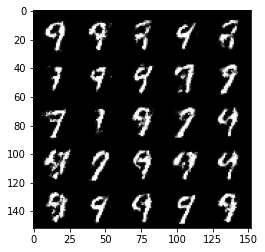

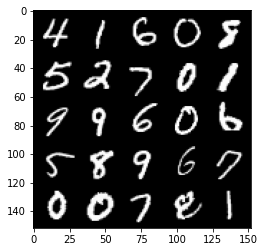

  0%|          | 0/469 [00:00<?, ?it/s]

step : 35500, epoch : 75 , mean_discriminator_loss : 0.22879296058416354, mean_generator_loss : 2.683434383869173


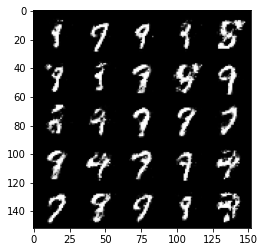

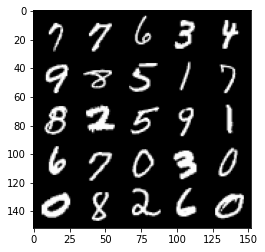

  0%|          | 0/469 [00:00<?, ?it/s]

step : 36000, epoch : 76 , mean_discriminator_loss : 0.2308078308403493, mean_generator_loss : 2.706269788265227


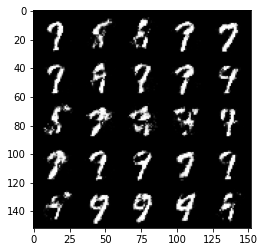

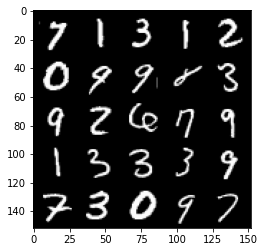

  0%|          | 0/469 [00:00<?, ?it/s]

step : 36500, epoch : 77 , mean_discriminator_loss : 0.2444306759238244, mean_generator_loss : 2.626283168315889


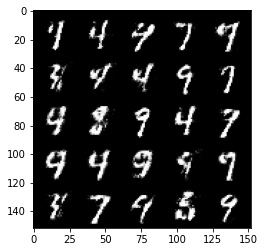

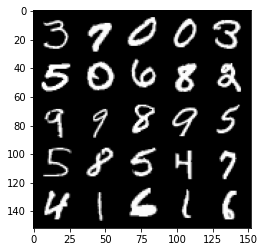

  0%|          | 0/469 [00:00<?, ?it/s]

step : 37000, epoch : 78 , mean_discriminator_loss : 0.23235695315897467, mean_generator_loss : 2.6043624813556634


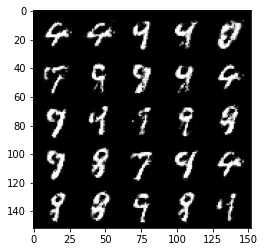

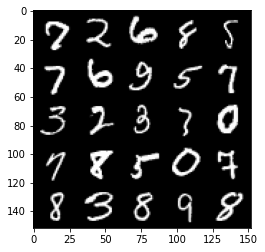

  0%|          | 0/469 [00:00<?, ?it/s]

step : 37500, epoch : 79 , mean_discriminator_loss : 0.23433363130688656, mean_generator_loss : 2.65804495620728


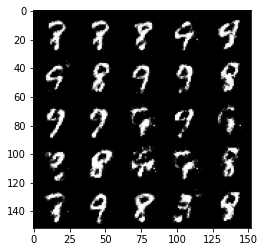

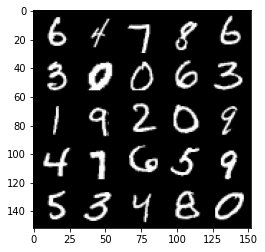

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

step : 38000, epoch : 81 , mean_discriminator_loss : 0.22805696132779132, mean_generator_loss : 2.6236002922058077


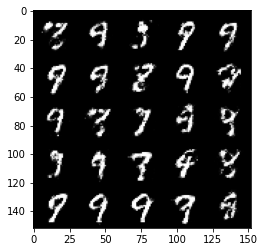

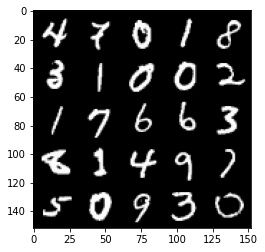

  0%|          | 0/469 [00:00<?, ?it/s]

step : 38500, epoch : 82 , mean_discriminator_loss : 0.24159474313259127, mean_generator_loss : 2.5352868747711215


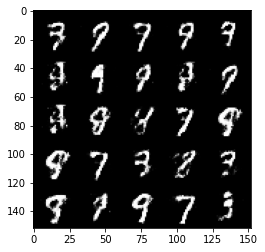

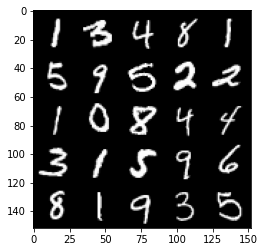

  0%|          | 0/469 [00:00<?, ?it/s]

step : 39000, epoch : 83 , mean_discriminator_loss : 0.2371986553370954, mean_generator_loss : 2.627539140701293


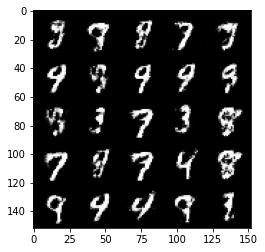

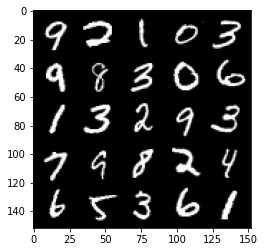

  0%|          | 0/469 [00:00<?, ?it/s]

step : 39500, epoch : 84 , mean_discriminator_loss : 0.25444963681697863, mean_generator_loss : 2.4499856956005113


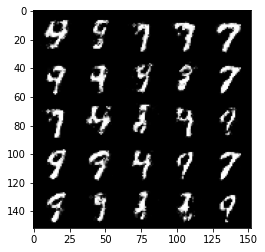

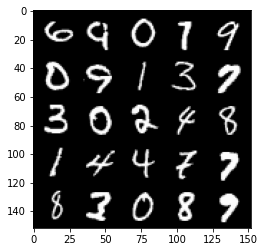

  0%|          | 0/469 [00:00<?, ?it/s]

step : 40000, epoch : 85 , mean_discriminator_loss : 0.23005043038725875, mean_generator_loss : 2.5002749345302586


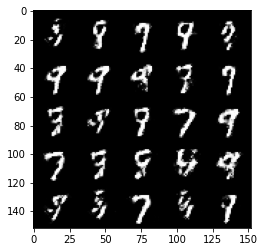

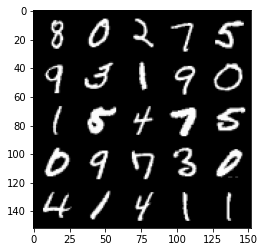

  0%|          | 0/469 [00:00<?, ?it/s]

step : 40500, epoch : 86 , mean_discriminator_loss : 0.23919649371504775, mean_generator_loss : 2.500396320819855


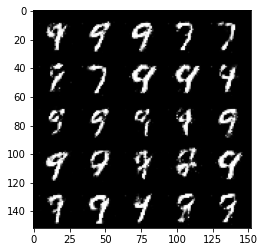

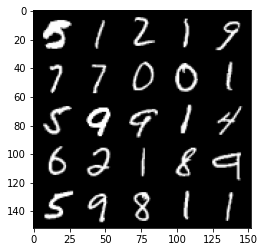

  0%|          | 0/469 [00:00<?, ?it/s]

step : 41000, epoch : 87 , mean_discriminator_loss : 0.2540873720049857, mean_generator_loss : 2.473929242134093


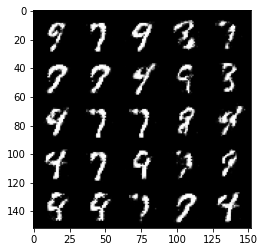

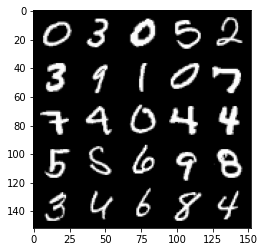

  0%|          | 0/469 [00:00<?, ?it/s]

step : 41500, epoch : 88 , mean_discriminator_loss : 0.24775174129009267, mean_generator_loss : 2.52184038233757


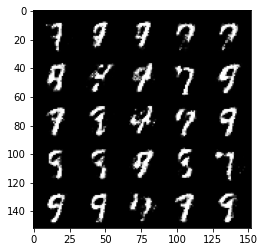

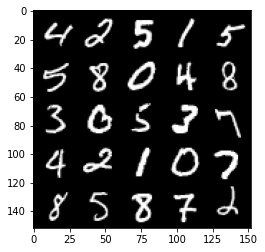

  0%|          | 0/469 [00:00<?, ?it/s]

step : 42000, epoch : 89 , mean_discriminator_loss : 0.252260369285941, mean_generator_loss : 2.509879299640655


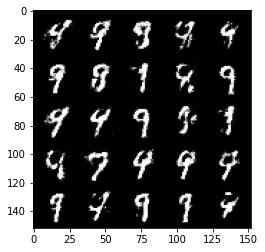

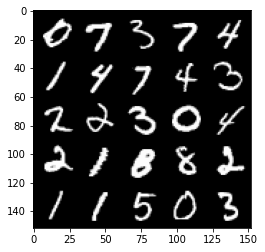

  0%|          | 0/469 [00:00<?, ?it/s]

step : 42500, epoch : 90 , mean_discriminator_loss : 0.24674044400453554, mean_generator_loss : 2.4785176563262956


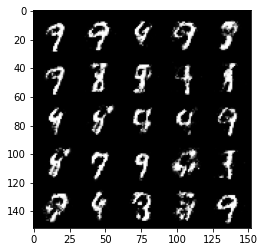

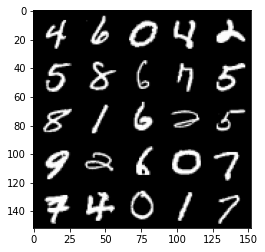

  0%|          | 0/469 [00:00<?, ?it/s]

step : 43000, epoch : 91 , mean_discriminator_loss : 0.25501230037212386, mean_generator_loss : 2.4520518026351907


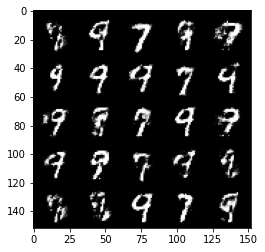

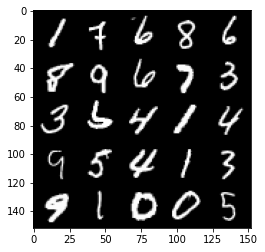

  0%|          | 0/469 [00:00<?, ?it/s]

step : 43500, epoch : 92 , mean_discriminator_loss : 0.28538446241617227, mean_generator_loss : 2.4077059743404376


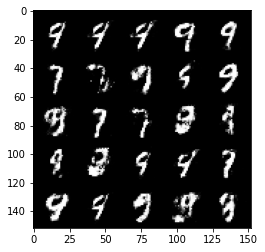

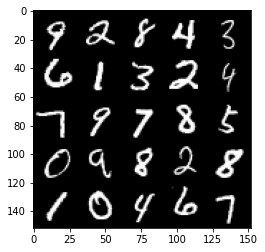

  0%|          | 0/469 [00:00<?, ?it/s]

step : 44000, epoch : 93 , mean_discriminator_loss : 0.24759579545259472, mean_generator_loss : 2.436105685710908


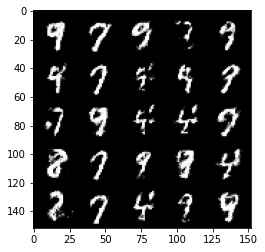

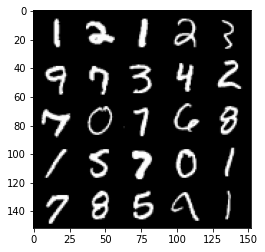

  0%|          | 0/469 [00:00<?, ?it/s]

step : 44500, epoch : 94 , mean_discriminator_loss : 0.2529783004820346, mean_generator_loss : 2.3915742487907385


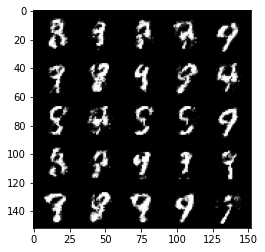

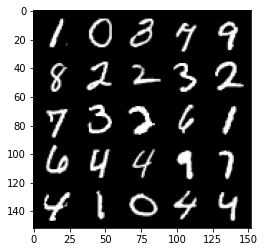

  0%|          | 0/469 [00:00<?, ?it/s]

step : 45000, epoch : 95 , mean_discriminator_loss : 0.26111086744070067, mean_generator_loss : 2.3362973377704637


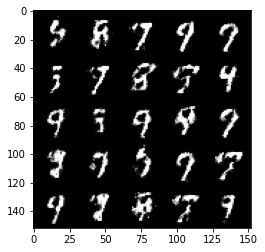

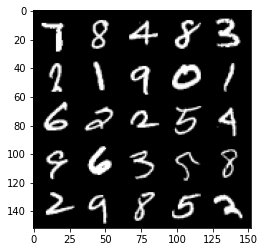

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

step : 45500, epoch : 97 , mean_discriminator_loss : 0.2776712012887, mean_generator_loss : 2.301176311731339


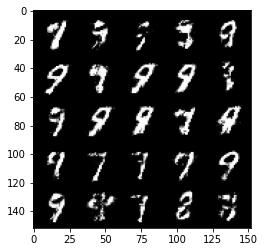

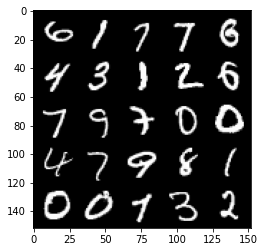

  0%|          | 0/469 [00:00<?, ?it/s]

step : 46000, epoch : 98 , mean_discriminator_loss : 0.2654269673228263, mean_generator_loss : 2.2822312953472146


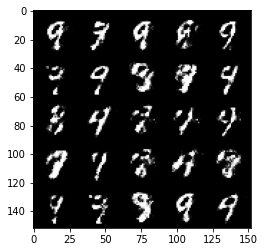

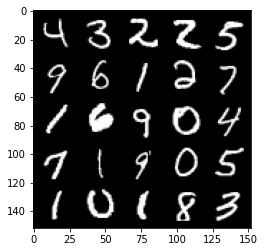

  0%|          | 0/469 [00:00<?, ?it/s]

step : 46500, epoch : 99 , mean_discriminator_loss : 0.2427449002265928, mean_generator_loss : 2.448564752340318


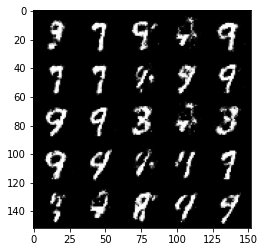

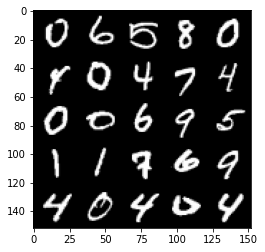

  0%|          | 0/469 [00:00<?, ?it/s]

step : 47000, epoch : 100 , mean_discriminator_loss : 0.2884694753587246, mean_generator_loss : 2.3720952408313747


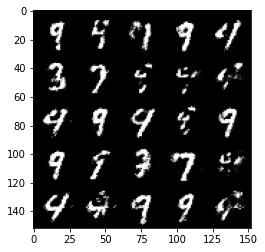

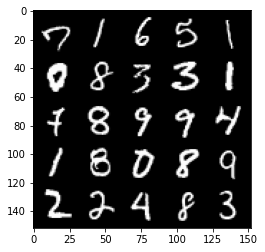

  0%|          | 0/469 [00:00<?, ?it/s]

step : 47500, epoch : 101 , mean_discriminator_loss : 0.2728166216909888, mean_generator_loss : 2.3584836263656626


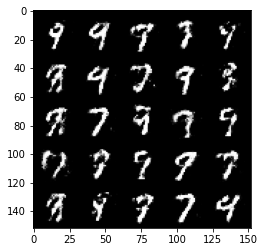

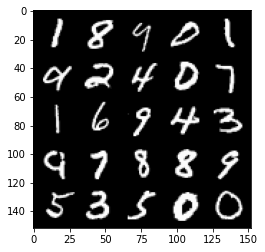

  0%|          | 0/469 [00:00<?, ?it/s]

step : 48000, epoch : 102 , mean_discriminator_loss : 0.28312151533365254, mean_generator_loss : 2.265063837289811


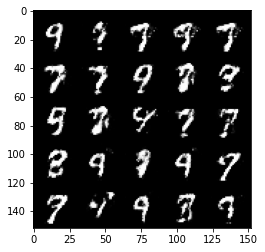

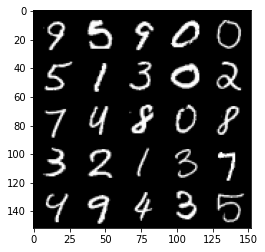

  0%|          | 0/469 [00:00<?, ?it/s]

step : 48500, epoch : 103 , mean_discriminator_loss : 0.2784155643582343, mean_generator_loss : 2.3546966686248783


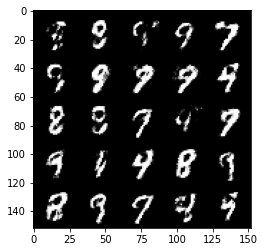

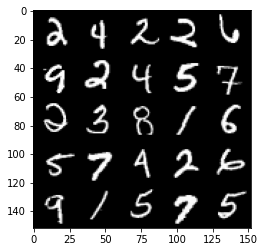

  0%|          | 0/469 [00:00<?, ?it/s]

step : 49000, epoch : 104 , mean_discriminator_loss : 0.287350766122341, mean_generator_loss : 2.2381502656936667


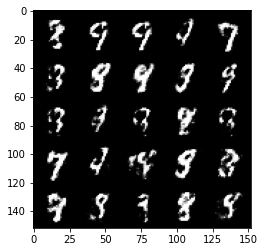

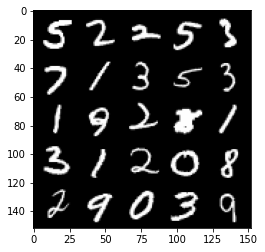

  0%|          | 0/469 [00:00<?, ?it/s]

step : 49500, epoch : 105 , mean_discriminator_loss : 0.29238784354925146, mean_generator_loss : 2.2589525775909425


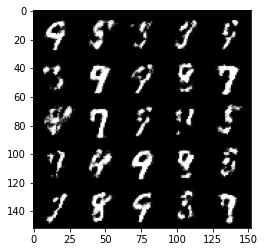

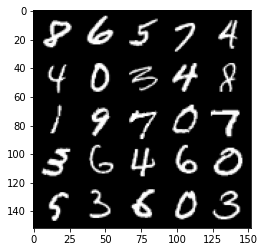

  0%|          | 0/469 [00:00<?, ?it/s]

step : 50000, epoch : 106 , mean_discriminator_loss : 0.2737038936018944, mean_generator_loss : 2.272655571937561


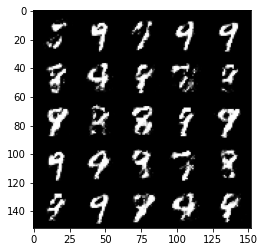

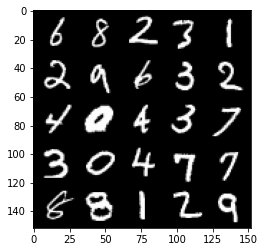

  0%|          | 0/469 [00:00<?, ?it/s]

step : 50500, epoch : 107 , mean_discriminator_loss : 0.255906278580427, mean_generator_loss : 2.29588607931137


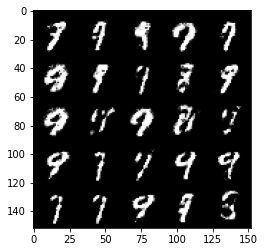

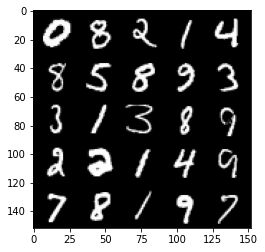

  0%|          | 0/469 [00:00<?, ?it/s]

step : 51000, epoch : 108 , mean_discriminator_loss : 0.28908202087879176, mean_generator_loss : 2.231461459159852


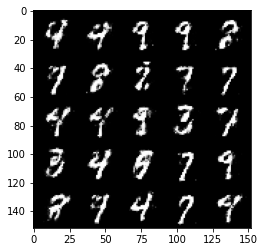

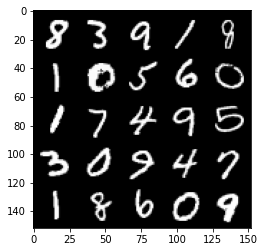

  0%|          | 0/469 [00:00<?, ?it/s]

step : 51500, epoch : 109 , mean_discriminator_loss : 0.30137988135218613, mean_generator_loss : 2.182711166620257


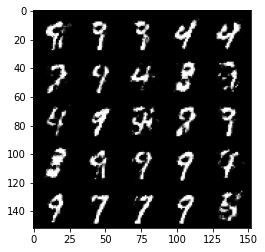

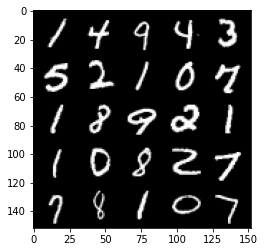

  0%|          | 0/469 [00:00<?, ?it/s]

step : 52000, epoch : 110 , mean_discriminator_loss : 0.2985554663836958, mean_generator_loss : 2.1782789416313175


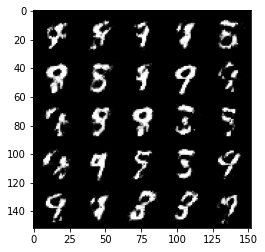

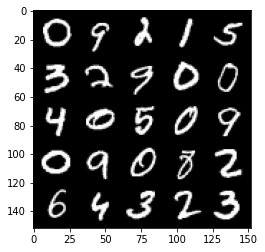

  0%|          | 0/469 [00:00<?, ?it/s]

step : 52500, epoch : 111 , mean_discriminator_loss : 0.31139120134711257, mean_generator_loss : 2.1047296252250645


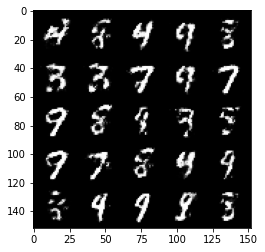

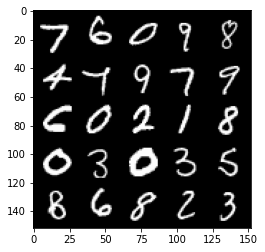

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

step : 53000, epoch : 113 , mean_discriminator_loss : 0.30919632568955413, mean_generator_loss : 2.087784396409988


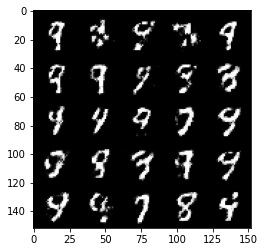

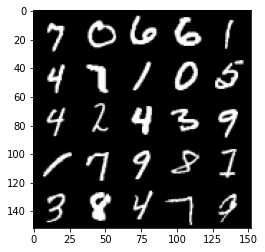

  0%|          | 0/469 [00:00<?, ?it/s]

step : 53500, epoch : 114 , mean_discriminator_loss : 0.3139868158102037, mean_generator_loss : 2.0800457506179812


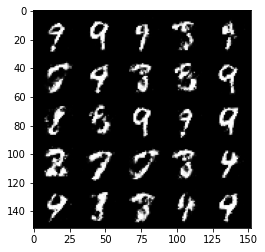

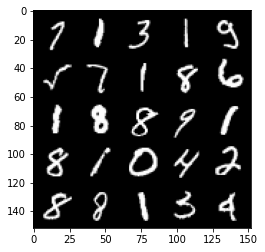

  0%|          | 0/469 [00:00<?, ?it/s]

step : 54000, epoch : 115 , mean_discriminator_loss : 0.3018200258314615, mean_generator_loss : 2.115682626008989


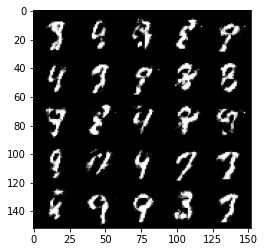

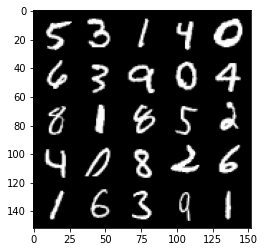

  0%|          | 0/469 [00:00<?, ?it/s]

step : 54500, epoch : 116 , mean_discriminator_loss : 0.3010817481875418, mean_generator_loss : 2.126397418022157


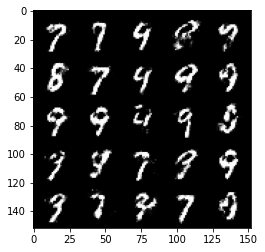

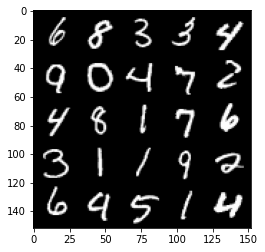

  0%|          | 0/469 [00:00<?, ?it/s]

step : 55000, epoch : 117 , mean_discriminator_loss : 0.30284040749073005, mean_generator_loss : 2.1148127071857457


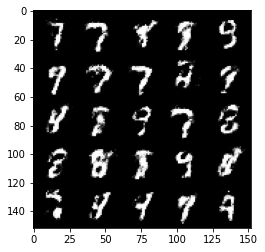

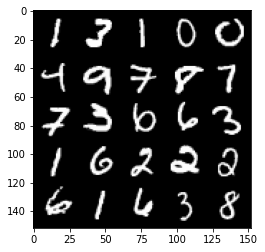

  0%|          | 0/469 [00:00<?, ?it/s]

step : 55500, epoch : 118 , mean_discriminator_loss : 0.31717997828125954, mean_generator_loss : 2.0692634603977194


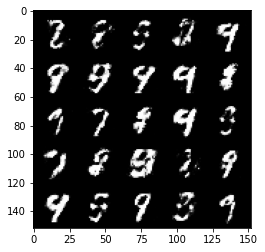

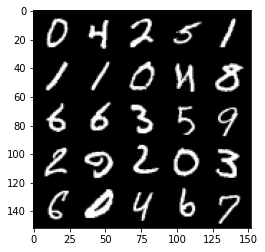

In [ ]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True
gen_loss = False
error = False

for epoch in range(n_epochs):
    for real,_ in tqdm(dataloader):
        cur_batch_size = len(real)
        
        #flatten the batch size of real images from datasets
        real = real.view(cur_batch_size,-1).to(device)
        
        ##update discriminator
        #zero out the gradients before backpropogation
        disc_opt.zero_grad()
        
        #calculate discriminator loss 
        disc_loss = get_disc_loss(gen,disc,criterion,real,cur_batch_size,z_dim,device)
        #apply backprob
        disc_loss.backward(retain_graph = True)
        #update optimiser
        disc_opt.step()
        
        #for testing purpose, keep track of generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()
            
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc,criterion,cur_batch_size,z_dim,device)
        gen_loss.backward(retain_graph = True)
        gen_opt.step()
        
        # if test_generator:
        #     try:
        #         #assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max()<0.0005 and epoch == 0) 
        #         assert torch.any(gen.gen[0][0].weight.detach().clone) != old_generator_weights 
        #     except:
        #         error = True
        #         print("Runtime tests have failed")
        mean_discriminator_loss += disc_loss.item()/display_step
        mean_generator_loss += gen_loss.item()/display_step
        
        ###visualize code###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"step : {cur_step}, epoch : {epoch} , mean_discriminator_loss : {mean_discriminator_loss}, mean_generator_loss : {mean_generator_loss}")
            fake_noise = get_noise(cur_batch_size,z_dim,device = device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_discriminator_loss = 0
            mean_generator_loss = 0
        cur_step += 1
        
        